### Data Dictionary for Reference

BASIC FEATURES OF EACH NETWORK CONNECTION VECTOR

1 Duration:Length of time duration of the connection 

2 Protocol_type:Protocol used in the connection 



In [114]:
import sklearn.tree as dt
from sklearn.tree import DecisionTreeClassifier, export, export_graphviz
from sklearn.model_selection import GridSearchCV

In [11]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import statsmodels.formula.api as sm
import scipy.stats as stats
import pandas_profiling
%matplotlib inline
plt.rcParams['figure.figsize'] = 12, 8
plt.rcParams['axes.grid'] = True
plt.gray()

<Figure size 864x576 with 0 Axes>

In [2]:
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices 

In [3]:
pd.set_option('display.max_rows',None)

In [4]:
col_names = ["duration","protocol_type","service","flag","src_bytes","dst_bytes","land", "wrong_fragment","urgent","hot","num_failed_logins","logged_in", "num_compromised","root_shell","su_attempted","num_root","num_file_creations", "num_shells","num_access_files","num_outbound_cmds","is_host_login", "is_guest_login","count","srv_count","serror_rate",  "srv_serror_rate", "rerror_rate","srv_rerror_rate","same_srv_rate",  "diff_srv_rate", "srv_diff_host_rate","dst_host_count","dst_host_srv_count","dst_host_same_srv_rate", "dst_host_diff_srv_rate","dst_host_same_src_port_rate","dst_host_srv_diff_host_rate","dst_host_serror_rate","dst_host_srv_serror_rate","dst_host_rerror_rate","dst_host_srv_rerror_rate","attack","last_flag"]
netdata = pd.read_csv("./NSL_Dataset/Train.txt",header=None,names = col_names)
netdata_test = pd.read_csv("./NSL_Dataset/Test.txt",header=None,names = col_names)
netdata.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,last_flag
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,20
1,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,15
2,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,19
3,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,21
4,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,21


In [5]:
netdata['Split'] = 'Train'
netdata_test['Split'] = 'Test'

In [6]:
netdata.drop(['last_flag'],axis = 1, inplace = True)
netdata_test.drop(['last_flag'],axis = 1, inplace = True)
netdata.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,Split
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,Train
1,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,Train
2,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,Train
3,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,Train
4,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,Train


In [7]:
netdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125973 entries, 0 to 125972
Data columns (total 43 columns):
duration                       125973 non-null int64
protocol_type                  125973 non-null object
service                        125973 non-null object
flag                           125973 non-null object
src_bytes                      125973 non-null int64
dst_bytes                      125973 non-null int64
land                           125973 non-null int64
wrong_fragment                 125973 non-null int64
urgent                         125973 non-null int64
hot                            125973 non-null int64
num_failed_logins              125973 non-null int64
logged_in                      125973 non-null int64
num_compromised                125973 non-null int64
root_shell                     125973 non-null int64
su_attempted                   125973 non-null int64
num_root                       125973 non-null int64
num_file_creations             125973 

In [8]:
netdata.isnull().sum()

duration                       0
protocol_type                  0
service                        0
flag                           0
src_bytes                      0
dst_bytes                      0
land                           0
wrong_fragment                 0
urgent                         0
hot                            0
num_failed_logins              0
logged_in                      0
num_compromised                0
root_shell                     0
su_attempted                   0
num_root                       0
num_file_creations             0
num_shells                     0
num_access_files               0
num_outbound_cmds              0
is_host_login                  0
is_guest_login                 0
count                          0
srv_count                      0
serror_rate                    0
srv_serror_rate                0
rerror_rate                    0
srv_rerror_rate                0
same_srv_rate                  0
diff_srv_rate                  0
srv_diff_h

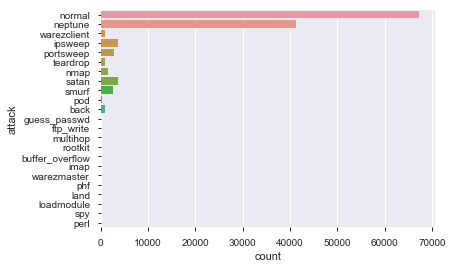

In [9]:
sns.countplot(y='attack', data = netdata)

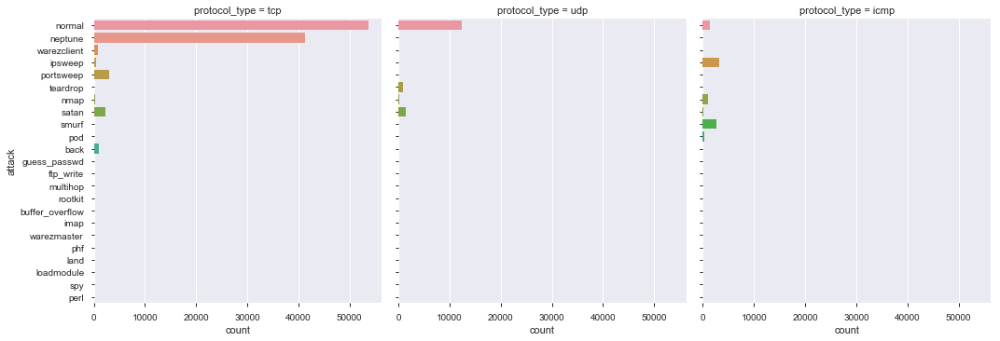

In [12]:
sns.catplot(y = 'attack', col = 'protocol_type', kind = 'count', data = netdata)

Normal attacks are highest followed by neptune in protocol_type tcp 

Normal attacks are highest in protocol_type udp

In [13]:
netdata['flag'].value_counts()

SF        74945
S0        34851
REJ       11233
RSTR       2421
RSTO       1562
S1          365
SH          271
S2          127
RSTOS0      103
S3           49
OTH          46
Name: flag, dtype: int64

In [14]:
netdata.groupby('attack').count()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,Split
attack,,,,,,,,,,,,,,,,,,,,,
back,956,956,956,956,956,956,956,956,956,956,...,956,956,956,956,956,956,956,956,956,956
buffer_overflow,30,30,30,30,30,30,30,30,30,30,...,30,30,30,30,30,30,30,30,30,30
ftp_write,8,8,8,8,8,8,8,8,8,8,...,8,8,8,8,8,8,8,8,8,8
guess_passwd,53,53,53,53,53,53,53,53,53,53,...,53,53,53,53,53,53,53,53,53,53
imap,11,11,11,11,11,11,11,11,11,11,...,11,11,11,11,11,11,11,11,11,11
ipsweep,3599,3599,3599,3599,3599,3599,3599,3599,3599,3599,...,3599,3599,3599,3599,3599,3599,3599,3599,3599,3599
land,18,18,18,18,18,18,18,18,18,18,...,18,18,18,18,18,18,18,18,18,18
loadmodule,9,9,9,9,9,9,9,9,9,9,...,9,9,9,9,9,9,9,9,9,9
multihop,7,7,7,7,7,7,7,7,7,7,...,7,7,7,7,7,7,7,7,7,7


In [15]:
network = pd.concat([netdata, netdata_test], axis = 0)

In [16]:
network.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,Split
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,Train
1,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,Train
2,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,Train
3,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,Train
4,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,Train


In [17]:
network.shape

(148517, 43)

In [18]:
network.to_csv("Network_data.csv")

In [39]:
pandas_profiling.ProfileReport(network)

Dropping variables that cause high correlation with multiple variables.

In [19]:
network.drop(['dst_host_srv_rerror_rate','dst_host_srv_serror_rate'], axis = 1, inplace = True)

In [20]:
network.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_rerror_rate,attack,Split
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,150,25,0.17,0.03,0.17,0.00,0.00,0.05,normal,Train
1,0,udp,other,SF,146,0,0,0,0,0,...,255,1,0.00,0.60,0.88,0.00,0.00,0.00,normal,Train
2,0,tcp,private,S0,0,0,0,0,0,0,...,255,26,0.10,0.05,0.00,0.00,1.00,0.00,neptune,Train
3,0,tcp,http,SF,232,8153,0,0,0,0,...,30,255,1.00,0.00,0.03,0.04,0.03,0.00,normal,Train
4,0,tcp,http,SF,199,420,0,0,0,0,...,255,255,1.00,0.00,0.00,0.00,0.00,0.00,normal,Train


In [21]:
network.corr()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_rerror_rate
duration,1.000000,0.068959,0.034056,-0.001651,-0.009616,0.002426,0.000664,0.000525,-0.064474,0.043998,...,-0.017784,-0.039485,0.050311,-0.098013,-0.104631,0.223635,0.201276,-0.025950,-0.053810,0.143896
src_bytes,0.068959,1.000000,0.000212,-0.000109,-0.000633,-0.000074,0.000347,-0.000443,-0.003286,-0.000079,...,-0.000637,-0.002500,-0.005586,-0.006663,-0.006312,0.000730,0.000559,-0.001424,-0.004003,-0.001746
dst_bytes,0.034056,0.000212,1.000000,-0.000068,-0.000394,0.000179,-0.000297,0.000096,-0.002635,0.001253,...,-0.001588,-0.001553,0.002225,-0.003977,-0.004168,0.009834,0.010847,-0.001143,-0.002639,0.009986
land,-0.001651,-0.000109,-0.000068,1.000000,-0.001255,-0.000153,-0.001381,-0.000878,-0.012056,-0.000168,...,-0.002565,0.040548,-0.024564,-0.015214,0.009425,-0.004612,0.032151,0.072119,0.020496,-0.005983
wrong_fragment,-0.009616,-0.000633,-0.000394,-0.001255,1.000000,-0.000889,-0.008042,-0.005115,-0.070207,-0.000981,...,-0.025896,-0.022829,0.032552,-0.046659,-0.046590,0.051988,0.040057,-0.009777,-0.045495,0.019283
urgent,0.002426,-0.000074,0.000179,-0.000153,-0.000889,1.000000,0.008151,0.037775,0.011253,0.029034,...,-0.003621,-0.003916,-0.011494,-0.009655,-0.003882,0.007248,0.002249,0.005386,-0.005676,-0.003789
hot,0.000664,0.000347,-0.000297,-0.001381,-0.008042,0.008151,1.000000,0.000297,0.113230,0.002582,...,-0.017705,-0.026141,-0.012182,-0.051125,-0.036210,-0.009751,-0.033311,-0.022945,-0.053126,-0.031549
num_failed_logins,0.000525,-0.000443,0.000096,-0.000878,-0.005115,0.037775,0.000297,1.000000,-0.039066,0.010565,...,-0.017883,-0.022160,0.005604,-0.006239,0.003340,-0.013585,-0.023664,-0.009839,-0.032305,-0.007965
logged_in,-0.064474,-0.003286,-0.002635,-0.012056,-0.070207,0.011253,0.113230,-0.039066,1.000000,0.013970,...,-0.221172,0.122004,-0.385985,0.618150,0.598829,-0.256912,-0.177222,-0.054807,-0.465806,-0.290705
num_compromised,0.043998,-0.000079,0.001253,-0.000168,-0.000981,0.029034,0.002582,0.010565,0.013970,1.000000,...,-0.003957,-0.004141,-0.011188,-0.010329,-0.005224,0.002618,-0.001998,0.004064,-0.003901,-0.004044


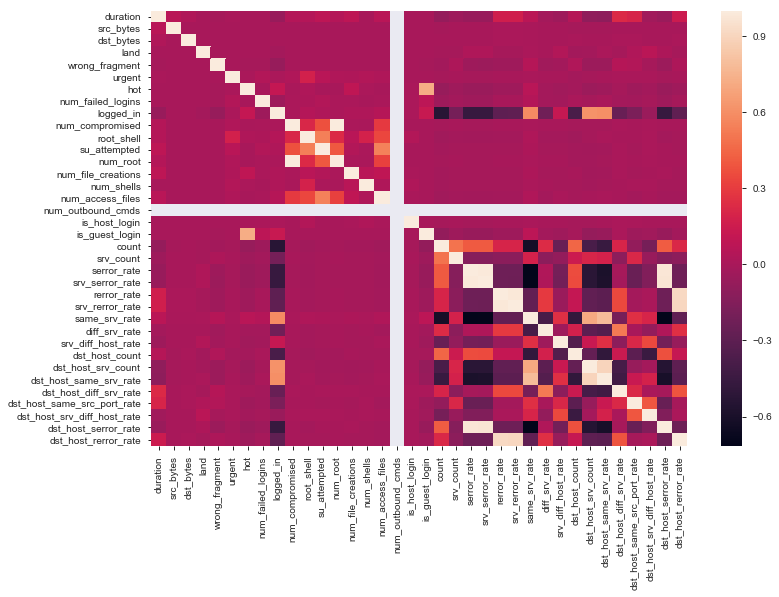

In [22]:
sns.heatmap(network.corr())

In [23]:
network.drop(['num_outbound_cmds'],axis = 1, inplace = True)
network.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_rerror_rate,attack,Split
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,150,25,0.17,0.03,0.17,0.00,0.00,0.05,normal,Train
1,0,udp,other,SF,146,0,0,0,0,0,...,255,1,0.00,0.60,0.88,0.00,0.00,0.00,normal,Train
2,0,tcp,private,S0,0,0,0,0,0,0,...,255,26,0.10,0.05,0.00,0.00,1.00,0.00,neptune,Train
3,0,tcp,http,SF,232,8153,0,0,0,0,...,30,255,1.00,0.00,0.03,0.04,0.03,0.00,normal,Train
4,0,tcp,http,SF,199,420,0,0,0,0,...,255,255,1.00,0.00,0.00,0.00,0.00,0.00,normal,Train


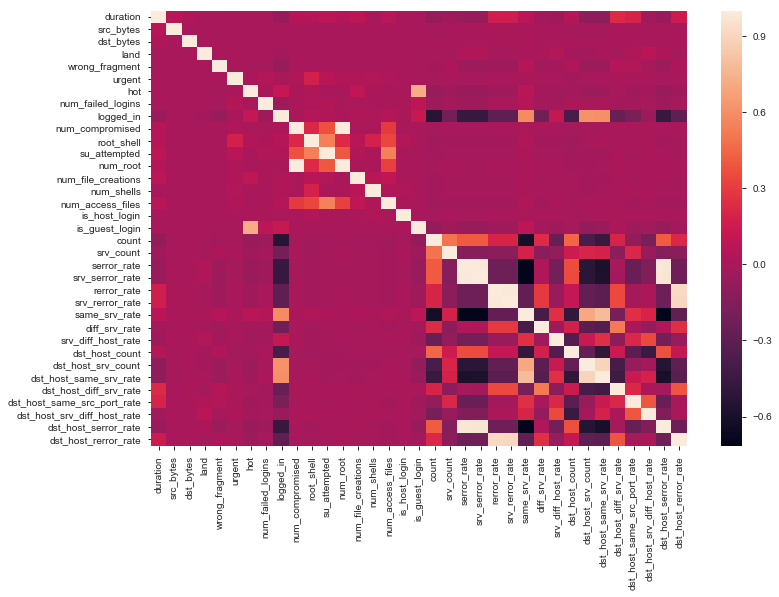

In [24]:
sns.heatmap(network.corr())

In [25]:
num_var = [key for key in dict(network.dtypes) if dict(network.dtypes)[key] in ['float32','float64','int32','int64']]
cat_var = [key for key in dict(network.dtypes) if dict(network.dtypes)[key] in ['object','O']]
print(num_var)
print(cat_var)

['duration', 'src_bytes', 'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot', 'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell', 'su_attempted', 'num_root', 'num_file_creations', 'num_shells', 'num_access_files', 'is_host_login', 'is_guest_login', 'count', 'srv_count', 'serror_rate', 'srv_serror_rate', 'rerror_rate', 'srv_rerror_rate', 'same_srv_rate', 'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count', 'dst_host_srv_count', 'dst_host_same_srv_rate', 'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate', 'dst_host_srv_diff_host_rate', 'dst_host_serror_rate', 'dst_host_rerror_rate']
['protocol_type', 'service', 'flag', 'attack', 'Split']


In [26]:
network_num = network[num_var]
network_cat = network[cat_var]
network_num.head()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_rerror_rate
0,0,491,0,0,0,0,0,0,0,0,...,0.00,0.00,150,25,0.17,0.03,0.17,0.00,0.00,0.05
1,0,146,0,0,0,0,0,0,0,0,...,0.15,0.00,255,1,0.00,0.60,0.88,0.00,0.00,0.00
2,0,0,0,0,0,0,0,0,0,0,...,0.07,0.00,255,26,0.10,0.05,0.00,0.00,1.00,0.00
3,0,232,8153,0,0,0,0,0,1,0,...,0.00,0.00,30,255,1.00,0.00,0.03,0.04,0.03,0.00
4,0,199,420,0,0,0,0,0,1,0,...,0.00,0.09,255,255,1.00,0.00,0.00,0.00,0.00,0.00


In [27]:
def var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(), x.var(), x.std(), x.std()/x.mean(), x.min(), x.dropna().quantile(0.01), x.dropna().quantile(0.05), x.dropna().quantile(0.1), x.dropna().quantile(0.25), x.dropna().quantile(0.5), x.dropna().quantile(0.75), x.dropna().quantile(0.9), x.dropna().quantile(0.95), x.dropna().quantile(0.99), x.max()],
                     index = ['N','NMISS','SUM','MEAN','MEDIAN','VAR','STD','CV','MIN','P1','P5','P10','P25','P50','P75','P90','P95','P99','MAX'])

network_num.apply(var_summary).T

,N,NMISS,SUM,MEAN,MEDIAN,VAR,STD,CV,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
duration,148517.0,0.0,4.110643e+07,276.779305,0.00,6.054961e+06,2.460683e+03,8.890416,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,9.00,8172.00,5.771500e+04
src_bytes,148517.0,0.0,5.974534e+09,40227.949299,44.00,2.926390e+13,5.409612e+06,134.473959,0.0,0.0,0.00,0.00,0.00,44.00,278.00,884.00,1594.20,54540.00,1.379964e+09
dst_bytes,148517.0,0.0,2.537985e+09,17088.853593,0.00,1.371610e+13,3.703525e+06,216.721664,0.0,0.0,0.00,0.00,0.00,0.00,571.00,3437.40,8314.00,25598.16,1.309937e+09
land,148517.0,0.0,3.200000e+01,0.000215,0.00,2.154186e-04,1.467714e-02,68.118922,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.000000e+00
wrong_fragment,148517.0,0.0,3.048000e+03,0.020523,0.00,5.763316e-02,2.400691e-01,11.697618,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.000000e+00
urgent,148517.0,0.0,3.000000e+01,0.000202,0.00,3.770229e-04,1.941708e-02,96.125543,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.000000e+00
hot,148517.0,0.0,2.812600e+04,0.189379,0.00,4.052813e+00,2.013160e+00,10.630323,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,1.010000e+02
num_failed_logins,148517.0,0.0,6.420000e+02,0.004323,0.00,5.219807e-03,7.224823e-02,16.713536,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.000000e+00
logged_in,148517.0,0.0,5.982100e+04,0.402789,0.00,2.405516e-01,4.904606e-01,1.217662,0.0,0.0,0.00,0.00,0.00,0.00,1.00,1.00,1.00,1.00,1.000000e+00
num_compromised,148517.0,0.0,3.788100e+04,0.255062,0.00,4.942340e+02,2.223137e+01,87.160769,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,7.479000e+03


In [28]:
def outlier_treatment(x):
    x = x.clip_upper(x.quantile(0.99))
    x = x.clip_lower(x.quantile(0.01))
    return x

network_num = network_num.apply(outlier_treatment)

C:\Users\ShubhamG\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: clip_upper(threshold) is deprecated, use clip(upper=threshold) instead
  
C:\Users\ShubhamG\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: clip_lower(threshold) is deprecated, use clip(lower=threshold) instead
  This is separate from the ipykernel package so we can avoid doing imports until


In [29]:
def var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(), x.var(), x.std(), x.min(), x.dropna().quantile(0.01), x.dropna().quantile(0.05), x.dropna().quantile(0.1), x.dropna().quantile(0.25), x.dropna().quantile(0.5), x.dropna().quantile(0.75), x.dropna().quantile(0.9), x.dropna().quantile(0.95), x.dropna().quantile(0.99), x.max()],
                     index = ['N','NMISS','SUM','MEAN','MEDIAN','VAR','STD','MIN','P1','P5','P10','P25','P50','P75','P90','P95','P99','MAX'])

network_num.apply(var_summary).T

,N,NMISS,SUM,MEAN,MEDIAN,VAR,STD,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
duration,148517.0,0.0,2.183444e+07,147.016449,0.00,9.903342e+05,995.155352,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,9.00,8172.0000,8172.00
src_bytes,148517.0,0.0,1.945879e+08,1310.206475,44.00,5.254102e+07,7248.518266,0.0,0.0,0.00,0.00,0.00,44.00,278.00,884.00,1594.20,54540.0000,54540.00
dst_bytes,148517.0,0.0,2.012465e+08,1355.040391,0.00,1.455415e+07,3814.989900,0.0,0.0,0.00,0.00,0.00,0.00,571.00,3437.40,8314.00,25594.9344,25598.16
land,148517.0,0.0,0.000000e+00,0.000000,0.00,0.000000e+00,0.000000,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0000,0.00
wrong_fragment,148517.0,0.0,0.000000e+00,0.000000,0.00,0.000000e+00,0.000000,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0000,0.00
urgent,148517.0,0.0,0.000000e+00,0.000000,0.00,0.000000e+00,0.000000,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0000,0.00
hot,148517.0,0.0,6.897000e+03,0.046439,0.00,8.763170e-02,0.296027,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.0000,2.00
num_failed_logins,148517.0,0.0,0.000000e+00,0.000000,0.00,0.000000e+00,0.000000,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0000,0.00
logged_in,148517.0,0.0,5.982100e+04,0.402789,0.00,2.405516e-01,0.490461,0.0,0.0,0.00,0.00,0.00,0.00,1.00,1.00,1.00,1.0000,1.00
num_compromised,148517.0,0.0,1.655000e+03,0.011144,0.00,1.101940e-02,0.104973,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.0000,1.00


In [30]:
network_cat.head()

,protocol_type,service,flag,attack,Split
0,tcp,ftp_data,SF,normal,Train
1,udp,other,SF,normal,Train
2,tcp,private,S0,neptune,Train
3,tcp,http,SF,normal,Train
4,tcp,http,SF,normal,Train


In [31]:
print("Number of protocol type categories:")
print(len(network_cat['protocol_type'].unique()))
print("Number of service categories:")
print(len(network_cat['service'].unique()))
print("Number of flag categories")
print(len(network_cat['flag'].unique()))

Number of protocol type categories:
3
Number of service categories:
70
Number of flag categories
11


As there is high cardinality in each of the categorical variables, we need to create dummies for each. 

Total dummy variables = 3 + 70 + 11 = 84 dummy variables

In [32]:
def create_dummies(df,colname):
    col_dummies = pd.get_dummies(df[colname], prefix = colname, drop_first=True)
    df = pd.concat([df, col_dummies],axis = 1)
    df.drop([colname],axis = 1, inplace = True)
    return df

In [33]:
for features in ['service','flag','protocol_type']:
    network_cat[features] = network_cat[features].astype('category')
    network_cat = create_dummies(network_cat, features)

C:\Users\ShubhamG\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [34]:
network_cat.head()

,attack,Split,service_X11,service_Z39_50,service_aol,service_auth,service_bgp,service_courier,service_csnet_ns,service_ctf,...,flag_RSTOS0,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH,protocol_type_tcp,protocol_type_udp
0,normal,Train,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
1,normal,Train,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
2,neptune,Train,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
3,normal,Train,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
4,normal,Train,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0


In [35]:
network_cat['attack'].unique()

array(['normal', 'neptune', 'warezclient', 'ipsweep', 'portsweep',
       'teardrop', 'nmap', 'satan', 'smurf', 'pod', 'back',
       'guess_passwd', 'ftp_write', 'multihop', 'rootkit',
       'buffer_overflow', 'imap', 'warezmaster', 'phf', 'land',
       'loadmodule', 'spy', 'perl', 'saint', 'mscan', 'apache2',
       'snmpgetattack', 'processtable', 'httptunnel', 'ps', 'snmpguess',
       'mailbomb', 'named', 'sendmail', 'xterm', 'worm', 'xlock',
       'xsnoop', 'sqlattack', 'udpstorm'], dtype=object)

In [36]:
network_cat['attack_class'] = np.where(network_cat['attack']!='normal',1,0)
network_cat.head()

,attack,Split,service_X11,service_Z39_50,service_aol,service_auth,service_bgp,service_courier,service_csnet_ns,service_ctf,...,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH,protocol_type_tcp,protocol_type_udp,attack_class
0,normal,Train,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
1,normal,Train,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
2,neptune,Train,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,1
3,normal,Train,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
4,normal,Train,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0


In [37]:
network_cat['attack_class'].value_counts()

0    77054
1    71463
Name: attack_class, dtype: int64

In [38]:
network_cat.drop(['attack'],axis = 1, inplace = True)
print(network_cat.columns)
network_cat.head()

Index(['Split', 'service_X11', 'service_Z39_50', 'service_aol', 'service_auth',
       'service_bgp', 'service_courier', 'service_csnet_ns', 'service_ctf',
       'service_daytime', 'service_discard', 'service_domain',
       'service_domain_u', 'service_echo', 'service_eco_i', 'service_ecr_i',
       'service_efs', 'service_exec', 'service_finger', 'service_ftp',
       'service_ftp_data', 'service_gopher', 'service_harvest',
       'service_hostnames', 'service_http', 'service_http_2784',
       'service_http_443', 'service_http_8001', 'service_imap4',
       'service_iso_tsap', 'service_klogin', 'service_kshell', 'service_ldap',
       'service_link', 'service_login', 'service_mtp', 'service_name',
       'service_netbios_dgm', 'service_netbios_ns', 'service_netbios_ssn',
       'service_netstat', 'service_nnsp', 'service_nntp', 'service_ntp_u',
       'service_other', 'service_pm_dump', 'service_pop_2', 'service_pop_3',
       'service_printer', 'service_private', 'service_red_i',


,Split,service_X11,service_Z39_50,service_aol,service_auth,service_bgp,service_courier,service_csnet_ns,service_ctf,service_daytime,...,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH,protocol_type_tcp,protocol_type_udp,attack_class
0,Train,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
1,Train,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
2,Train,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,1
3,Train,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
4,Train,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0


In [39]:
data = pd.concat([network_num,network_cat],axis=1)
data.head()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH,protocol_type_tcp,protocol_type_udp,attack_class
0,0,491,0.0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
1,0,146,0.0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
2,0,0,0.0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,1
3,0,232,8153.0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0
4,0,199,420.0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0


In [40]:
data.corr()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH,protocol_type_tcp,protocol_type_udp,attack_class
duration,1.000000,0.031754,0.022298,NaN,NaN,NaN,0.014879,NaN,-0.070226,0.048040,...,0.413059,-0.084887,-0.007541,0.006298,0.023342,-0.014423,-0.007118,-0.037575,0.073506,0.030004
src_bytes,0.031754,1.000000,0.113106,NaN,NaN,NaN,0.428118,NaN,0.156236,0.559997,...,0.173601,-0.103860,0.034170,0.010169,0.009027,0.079689,-0.008709,0.071365,-0.062912,0.042868
dst_bytes,0.022298,0.113106,1.000000,NaN,NaN,NaN,0.145471,NaN,0.417963,0.239904,...,-0.024563,-0.204092,0.128407,0.039919,-0.008491,0.258516,-0.017114,0.161729,-0.123734,-0.292957
land,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
wrong_fragment,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
urgent,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
hot,0.014879,0.428118,0.145471,NaN,NaN,NaN,1.000000,NaN,0.183832,0.548446,...,0.011554,-0.089772,0.006734,0.067270,-0.003984,0.106346,-0.006612,0.073860,-0.057545,0.053186
num_failed_logins,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
logged_in,-0.070226,0.156236,0.417963,NaN,NaN,NaN,0.183832,NaN,1.000000,0.129262,...,-0.052190,-0.471858,0.046788,0.028786,-0.021485,0.622415,-0.039570,0.386658,-0.301251,-0.664117
num_compromised,0.048040,0.559997,0.239904,NaN,NaN,NaN,0.548446,NaN,0.129262,1.000000,...,0.010141,-0.060997,0.017258,-0.001209,-0.003327,0.075320,-0.005115,0.049980,-0.038940,0.060164


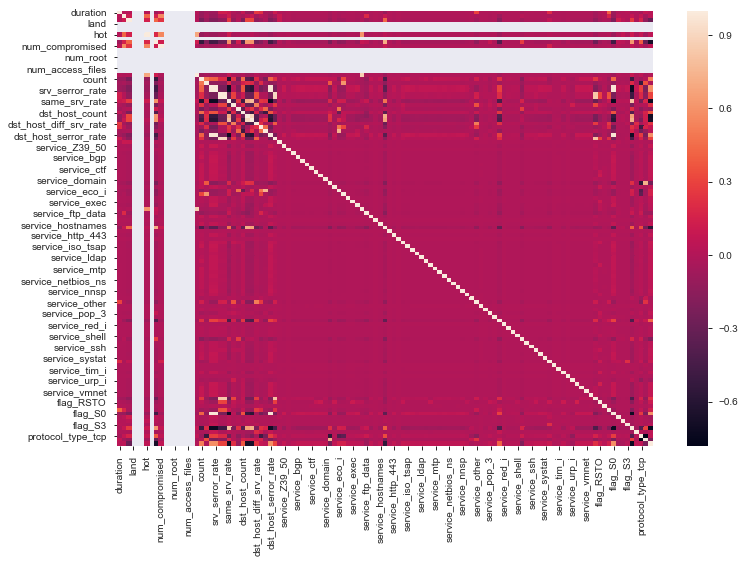

In [41]:
sns.heatmap(data.corr())

Dropping variables with NaN correlation

In [42]:
data.drop(['land','wrong_fragment','urgent','num_failed_logins', 'root_shell', 'su_attempted', 'num_root', 'num_file_creations', 'num_shells', 'num_access_files', 'is_host_login'], axis = 1, inplace = True)

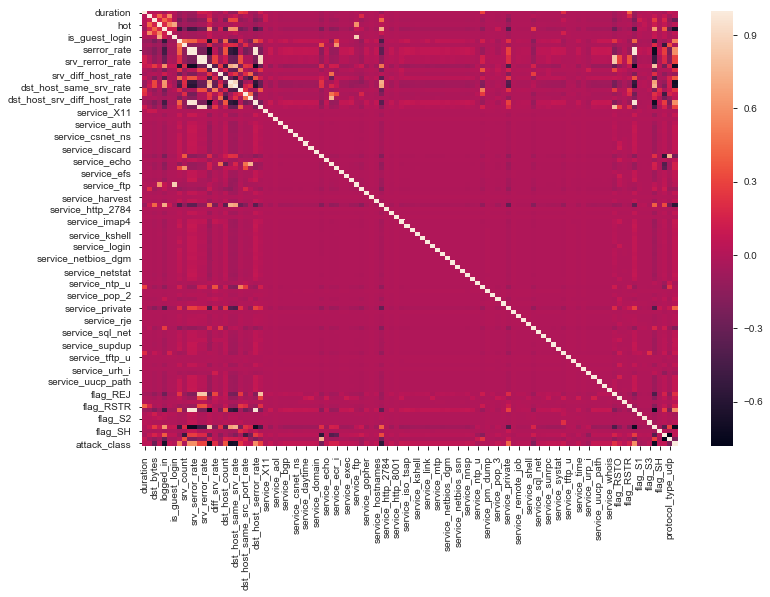

In [43]:
sns.heatmap(data.corr())

In [45]:
features = data.columns.difference(['attack_class'])
target = data['attack_class']
features

Index(['Split', 'count', 'diff_srv_rate', 'dst_bytes', 'dst_host_count',
       'dst_host_diff_srv_rate', 'dst_host_rerror_rate',
       'dst_host_same_src_port_rate', 'dst_host_same_srv_rate',
       'dst_host_serror_rate',
       ...
       'service_urp_i', 'service_uucp', 'service_uucp_path', 'service_vmnet',
       'service_whois', 'src_bytes', 'srv_count', 'srv_diff_host_rate',
       'srv_rerror_rate', 'srv_serror_rate'],
      dtype='object', length=106)

### Exploratory Data Analysis

#### Variable Reduction using Sommers' D

In [46]:
somersd_df = pd.DataFrame()
for variable in features:
    logreg = sm.logit(formula = str('attack_class ~ ')+str(variable), data = data)
    result = logreg.fit(method = 'bfgs')
    y_score = pd.DataFrame(result.predict())
    y_score.columns = ['Score']
    somers_d = 2*metrics.roc_auc_score(target,y_score) - 1
    temp = pd.DataFrame([variable,somers_d]).T
    temp.columns = ['Variable Name', 'Sommers D']
    somersd_df = pd.concat([somersd_df,temp],axis = 0)
    

Optimization terminated successfully.
         Current function value: 0.689656
         Iterations: 9
         Function evaluations: 11
         Gradient evaluations: 11
Optimization terminated successfully.
         Current function value: 0.516230
         Iterations: 10
         Function evaluations: 14
         Gradient evaluations: 14
Optimization terminated successfully.
         Current function value: 0.664631
         Iterations: 15
         Function evaluations: 16
         Gradient evaluations: 16


C:\Users\ShubhamG\Anaconda3\lib\site-packages\statsmodels\discrete\discrete_model.py:1724: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))
C:\Users\ShubhamG\Anaconda3\lib\site-packages\statsmodels\discrete\discrete_model.py:1724: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))


Optimization terminated successfully.
         Current function value: 0.602697
         Iterations: 11
         Function evaluations: 24
         Gradient evaluations: 15
Optimization terminated successfully.
         Current function value: 0.618243
         Iterations: 12
         Function evaluations: 15
         Gradient evaluations: 15
Optimization terminated successfully.
         Current function value: 0.656695
         Iterations: 13
         Function evaluations: 15
         Gradient evaluations: 15
Optimization terminated successfully.
         Current function value: 0.643208
         Iterations: 10
         Function evaluations: 12
         Gradient evaluations: 12
Optimization terminated successfully.
         Current function value: 0.689113
         Iterations: 11
         Function evaluations: 12
         Gradient evaluations: 12
Optimization terminated successfully.
         Current function value: 0.446227
         Iterations: 12
         Function evaluations: 13
  

C:\Users\ShubhamG\Anaconda3\lib\site-packages\statsmodels\discrete\discrete_model.py:1724: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))
C:\Users\ShubhamG\Anaconda3\lib\site-packages\statsmodels\discrete\discrete_model.py:1724: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))


         Current function value: 0.693147
         Iterations: 0
         Function evaluations: 16
         Gradient evaluations: 4


C:\Users\ShubhamG\Anaconda3\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.664892
         Iterations: 10
         Function evaluations: 12
         Gradient evaluations: 12
Optimization terminated successfully.
         Current function value: 0.685882
         Iterations: 17
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.691960
         Iterations: 17
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.681937
         Iterations: 17
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.480695
         Iterations: 14
         Function evaluations: 16
         Gradient evaluations: 16
Optimization terminated successfully.
         Current function value: 0.691128
         Iterations: 16
         Function evaluations: 19
  

Optimization terminated successfully.
         Current function value: 0.690197
         Iterations: 24
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.690845
         Iterations: 25
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.690321
         Iterations: 24
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.689940
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.690177
         Iterations: 24
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.690113
         Iterations: 27
         Function evaluations: 30
  

C:\Users\ShubhamG\Anaconda3\lib\site-packages\statsmodels\discrete\discrete_model.py:1724: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))
C:\Users\ShubhamG\Anaconda3\lib\site-packages\statsmodels\discrete\discrete_model.py:1724: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))


Optimization terminated successfully.
         Current function value: 0.691512
         Iterations: 9
         Function evaluations: 23
         Gradient evaluations: 13
Optimization terminated successfully.
         Current function value: 0.692324
         Iterations: 8
         Function evaluations: 11
         Gradient evaluations: 11
Optimization terminated successfully.
         Current function value: 0.685835
         Iterations: 12
         Function evaluations: 13
         Gradient evaluations: 13
Optimization terminated successfully.
         Current function value: 0.643972
         Iterations: 10
         Function evaluations: 12
         Gradient evaluations: 12
Optimization terminated successfully.
         Current function value: 0.483408
         Iterations: 13
         Function evaluations: 15
         Gradient evaluations: 15


In [47]:
somersd_df

,Variable Name,Sommers D
0,Split,0.0535469
0,count,0.56517
0,diff_srv_rate,0.646419
0,dst_bytes,0.784209
0,dst_host_count,0.408474
0,dst_host_diff_srv_rate,0.647118
0,dst_host_rerror_rate,0.242973
0,dst_host_same_src_port_rate,-0.270385
0,dst_host_same_srv_rate,0.711397
0,dst_host_serror_rate,0.558452


In [48]:
somersd_df.sort_values(by="Sommers D", ascending = False)

,Variable Name,Sommers D
0,dst_bytes,0.784209
0,dst_host_srv_count,0.760179
0,flag_SF,0.712021
0,dst_host_same_srv_rate,0.711397
0,same_srv_rate,0.696737
0,logged_in,0.651907
0,dst_host_diff_srv_rate,0.647118
0,diff_srv_rate,0.646419
0,count,0.56517
0,dst_host_serror_rate,0.558452


In [50]:
somersd_df = somersd_df[somersd_df['Sommers D']>0.2]
somersd_df

,Variable Name,Sommers D
0,count,0.56517
0,diff_srv_rate,0.646419
0,dst_bytes,0.784209
0,dst_host_count,0.408474
0,dst_host_diff_srv_rate,0.647118
0,dst_host_rerror_rate,0.242973
0,dst_host_same_srv_rate,0.711397
0,dst_host_serror_rate,0.558452
0,dst_host_srv_count,0.760179
0,flag_S0,0.5063


In [51]:
data_filter = data[somersd_df['Variable Name']]

In [52]:
data_filter['attack'] = data['attack_class']

C:\Users\ShubhamG\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [53]:
data_filter.head()

,count,diff_srv_rate,dst_bytes,dst_host_count,dst_host_diff_srv_rate,dst_host_rerror_rate,dst_host_same_srv_rate,dst_host_serror_rate,dst_host_srv_count,flag_S0,...,logged_in,rerror_rate,same_srv_rate,serror_rate,service_http,service_private,srv_diff_host_rate,srv_rerror_rate,srv_serror_rate,attack
0,2,0.00,0.0,150,0.03,0.05,0.17,0.00,25,0,...,0,0.0,1.00,0.0,0,0,0.00,0.0,0.0,0
1,13,0.15,0.0,255,0.60,0.00,0.00,0.00,1,0,...,0,0.0,0.08,0.0,0,0,0.00,0.0,0.0,0
2,123,0.07,0.0,255,0.05,0.00,0.10,1.00,26,1,...,0,0.0,0.05,1.0,0,1,0.00,0.0,1.0,1
3,5,0.00,8153.0,30,0.00,0.00,1.00,0.03,255,0,...,1,0.0,1.00,0.2,1,0,0.00,0.0,0.2,0
4,30,0.00,420.0,255,0.00,0.00,1.00,0.00,255,0,...,1,0.0,1.00,0.0,1,0,0.09,0.0,0.0,0


In [54]:
features = '+'.join(somersd_df['Variable Name'])
features

'count+diff_srv_rate+dst_bytes+dst_host_count+dst_host_diff_srv_rate+dst_host_rerror_rate+dst_host_same_srv_rate+dst_host_serror_rate+dst_host_srv_count+flag_S0+flag_SF+logged_in+rerror_rate+same_srv_rate+serror_rate+service_http+service_private+srv_diff_host_rate+srv_rerror_rate+srv_serror_rate'

### Variable Inflation Factor

In [55]:
a,b = dmatrices(formula_like='attack ~ count+diff_srv_rate+dst_bytes+dst_host_count+dst_host_diff_srv_rate+dst_host_rerror_rate+dst_host_same_srv_rate+dst_host_serror_rate+dst_host_srv_count+flag_S0+flag_SF+logged_in+rerror_rate+same_srv_rate+serror_rate+service_http+service_private+srv_diff_host_rate+srv_rerror_rate+srv_serror_rate', data = data_filter, return_type = 'dataframe')

vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(b.values, i) for i in range(b.shape[1])]
vif['Features'] = b.columns
vif

,VIF Factor,Features
0,340.186390,Intercept
1,2.044749,count
2,2.054970,diff_srv_rate
3,1.278568,dst_bytes
4,1.946639,dst_host_count
5,2.204051,dst_host_diff_srv_rate
6,7.694903,dst_host_rerror_rate
7,10.594700,dst_host_same_srv_rate
8,26.936105,dst_host_serror_rate
9,8.172742,dst_host_srv_count


In [65]:
a,b = dmatrices(formula_like='attack ~ count+diff_srv_rate+dst_bytes+dst_host_count+dst_host_diff_srv_rate+dst_host_serror_rate+dst_host_srv_count+logged_in+rerror_rate+same_srv_rate+service_http+service_private+srv_diff_host_rate', data = data_filter, return_type = 'dataframe')
#+dst_host_rerror_rate
vif = pd.DataFrame()
vif['VIF Factor'] = [variance_inflation_factor(b.values, i) for i in range(b.shape[1])]
vif['Features'] = b.columns
vif

,VIF Factor,Features
0,42.671381,Intercept
1,2.009720,count
2,1.858539,diff_srv_rate
3,1.268915,dst_bytes
4,1.605324,dst_host_count
5,1.846708,dst_host_diff_srv_rate
6,4.454410,dst_host_serror_rate
7,4.637633,dst_host_srv_count
8,2.952085,logged_in
9,2.322328,rerror_rate


In [75]:
vif = vif[vif['VIF Factor']<8]
vif

,VIF Factor,Features
1,2.009720,count
2,1.858539,diff_srv_rate
3,1.268915,dst_bytes
4,1.605324,dst_host_count
5,1.846708,dst_host_diff_srv_rate
6,4.454410,dst_host_serror_rate
7,4.637633,dst_host_srv_count
8,2.952085,logged_in
9,2.322328,rerror_rate
10,6.609941,same_srv_rate


In [79]:
features_new = "+".join(vif['Features'])
features_new

'count+diff_srv_rate+dst_bytes+dst_host_count+dst_host_diff_srv_rate+dst_host_serror_rate+dst_host_srv_count+logged_in+rerror_rate+same_srv_rate+service_http+service_private+srv_diff_host_rate'

In [80]:
data_filter_new = data_filter[vif['Features']]

In [81]:
data_filter_new['attack_new'] = data_filter['attack']
data_filter_new.head()

C:\Users\ShubhamG\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,count,diff_srv_rate,dst_bytes,dst_host_count,dst_host_diff_srv_rate,dst_host_serror_rate,dst_host_srv_count,logged_in,rerror_rate,same_srv_rate,service_http,service_private,srv_diff_host_rate,attack_new
0,2,0.00,0.0,150,0.03,0.00,25,0,0.0,1.00,0,0,0.00,0
1,13,0.15,0.0,255,0.60,0.00,1,0,0.0,0.08,0,0,0.00,0
2,123,0.07,0.0,255,0.05,1.00,26,0,0.0,0.05,0,1,0.00,1
3,5,0.00,8153.0,30,0.00,0.03,255,1,0.0,1.00,1,0,0.00,0
4,30,0.00,420.0,255,0.00,0.00,255,1,0.0,1.00,1,0,0.09,0


In [82]:
data_filter_new['Split'] = data['Split']

C:\Users\ShubhamG\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [83]:
data_filter_new.head()

,count,diff_srv_rate,dst_bytes,dst_host_count,dst_host_diff_srv_rate,dst_host_serror_rate,dst_host_srv_count,logged_in,rerror_rate,same_srv_rate,service_http,service_private,srv_diff_host_rate,attack_new,Split
0,2,0.00,0.0,150,0.03,0.00,25,0,0.0,1.00,0,0,0.00,0,Train
1,13,0.15,0.0,255,0.60,0.00,1,0,0.0,0.08,0,0,0.00,0,Train
2,123,0.07,0.0,255,0.05,1.00,26,0,0.0,0.05,0,1,0.00,1,Train
3,5,0.00,8153.0,30,0.00,0.03,255,1,0.0,1.00,1,0,0.00,0,Train
4,30,0.00,420.0,255,0.00,0.00,255,1,0.0,1.00,1,0,0.09,0,Train


In [84]:
data_filter_new.shape

(148517, 15)

In [85]:
pandas_profiling.ProfileReport(data_filter_new)

#### Train and Test Split

In [90]:
train = data_filter_new.loc[data_filter_new['Split']=='Train']
test = data_filter_new.loc[data_filter_new['Split']=='Test']

## Building logistic regression

In [87]:
logreg = sm.logit(formula = 'attack_new ~'+features_new, data = data_filter_new)
result = logreg.fit()

Optimization terminated successfully.
         Current function value: 0.248745
         Iterations 9


In [88]:
print(result.summary2())

                            Results: Logit
Model:                 Logit             Pseudo R-squared:  0.641      
Dependent Variable:    attack_new        AIC:               73913.7267 
Date:                  2020-02-29 18:00  BIC:               74052.4451 
No. Observations:      148517            Log-Likelihood:    -36943.    
Df Model:              13                LL-Null:           -1.0284e+05
Df Residuals:          148503            LLR p-value:       0.0000     
Converged:             1.0000            Scale:             1.0000     
No. Iterations:        9.0000                                          
-----------------------------------------------------------------------
                        Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
-----------------------------------------------------------------------
Intercept               0.9437   0.0591  15.9685 0.0000  0.8279  1.0596
count                   0.0049   0.0001  49.8187 0.0000  0.0047  0.0051
diff_srv_rate        

In [89]:
logreg = sm.logit(formula = 'attack_new ~ count+diff_srv_rate+dst_bytes+dst_host_diff_srv_rate+dst_host_serror_rate+dst_host_srv_count+logged_in+rerror_rate+same_srv_rate+service_http+service_private+srv_diff_host_rate', data = data_filter_new)
result = logreg.fit()
print(result.summary2())

Optimization terminated successfully.
         Current function value: 0.248745
         Iterations 9
                            Results: Logit
Model:                 Logit             Pseudo R-squared:  0.641      
Dependent Variable:    attack_new        AIC:               73911.8682 
Date:                  2020-02-29 18:01  BIC:               74040.6781 
No. Observations:      148517            Log-Likelihood:    -36943.    
Df Model:              12                LL-Null:           -1.0284e+05
Df Residuals:          148504            LLR p-value:       0.0000     
Converged:             1.0000            Scale:             1.0000     
No. Iterations:        9.0000                                          
-----------------------------------------------------------------------
                        Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
-----------------------------------------------------------------------
Intercept               0.9520   0.0549  17.3562 0.0000  0.8445

In [92]:
train_gini = 2*metrics.roc_auc_score(train['attack_new'],result.predict(train)) - 1
print("The Gini index score for the Training model is:", train_gini)

test_gini = 2*metrics.roc_auc_score(test['attack_new'],result.predict(test)) - 1
print("The Gini index score for the Test model is: {}".format(test_gini))

The Gini index score for the Training model is: 0.9494254291829718
The Gini index score for the Test model is: 0.7920951098048172


In [93]:
train_auc = metrics.roc_auc_score(train['attack_new'],result.predict(train))
print("The AUC for the model built on Train set is: {}".format(train_auc))
test_auc = metrics.roc_auc_score(test['attack_new'],result.predict(test))
print("The AUC for the model built on Test set is: {}".format(test_auc))

The AUC for the model built on Train set is: 0.9747127145914859
The AUC for the model built on Test set is: 0.8960475549024086


In [95]:
## Intuition behind ROC curve - predicted probability as a tool for separating the '1's and '0's
train_pred_prob = pd.DataFrame(result.predict(train))
train_pred_prob.columns = ['prob']
train_actual = train['attack_new']
# making a DataFrame with actual and prob columns
train_predict = pd.concat([train_actual,train_pred_prob],axis = 1)
train_predict.columns = ['actual','prob']
train_predict.head()

,actual,prob
0,0,0.353083
1,0,0.610200
2,1,0.997813
3,0,0.020524
4,0,0.020125


In [94]:
## Intuition behind ROC curve - predicted probability as a tool for separating the '1's and '0's
test_pred_prob = pd.DataFrame(result.predict(test))
test_pred_prob.columns = ['prob']
test_actual = test['attack_new']
# making a DataFrame with actual and prob columns
test_predict = pd.concat([test_actual,test_pred_prob],axis = 1)
test_predict.columns = ['actual','prob']
test_predict.head()

,actual,prob
0,1,0.995788
1,1,0.994000
2,0,0.270453
3,1,0.599389
4,1,0.878874


In [97]:
roc_df = pd.DataFrame()
train_temp = train_predict.copy()

for cut_off in np.linspace(0,1,100):
    train_temp['cut_off'] = cut_off
    train_temp['predicted'] = train_temp['prob'].apply(lambda x :0.0 if x < cut_off else 1.0)
    train_temp['tp'] = train_temp.apply(lambda x: 1.0 if x['actual'] == 1.0 and x['predicted'] == 1 else 0.0, axis = 1)
    train_temp['fp'] = train_temp.apply(lambda x: 1.0 if x['actual'] == 0.0 and x['predicted'] == 1 else 0.0, axis = 1)
    train_temp['tn'] = train_temp.apply(lambda x: 1.0 if x['actual'] == 0.0 and x['predicted'] == 0 else 0.0, axis = 1)
    train_temp['fn'] = train_temp.apply(lambda x: 1.0 if x['actual'] == 1.0 and x['predicted'] == 0 else 0.0, axis = 1)
    sensitivity = train_temp['tp'].sum()/(train_temp['tp'].sum()+train_temp['fn'].sum())
    specificity = train_temp['tn'].sum()/(train_temp['tn'].sum()+train_temp['fp'].sum())
    accuracy = (train_temp['tn'].sum()+train_temp['tp'].sum())/(train_temp['tp'].sum()+train_temp['fn'].sum()+train_temp['tn'].sum()+train_temp['fp'].sum())
    roc_table = pd.DataFrame([cut_off,sensitivity,specificity,accuracy]).T
    roc_table.columns = ['Cut_off','Sensitivity','Specificity','Accuracy']
    roc_df = pd.concat([roc_df,roc_table],axis = 0)
    

In [98]:
roc_df

,Cut_off,Sensitivity,Specificity,Accuracy
0,0.000000,1.000000,0.000000,0.465417
0,0.010101,0.999983,0.000030,0.465425
0,0.020202,0.998209,0.315638,0.633318
0,0.030303,0.995804,0.467383,0.713320
0,0.040404,0.993519,0.490949,0.724854
0,0.050505,0.991643,0.500705,0.729196
0,0.060606,0.989152,0.514322,0.735316
0,0.070707,0.987327,0.520752,0.737904
0,0.080808,0.985673,0.530553,0.742373
0,0.090909,0.985264,0.541096,0.747819


In [101]:
roc_df['total'] = roc_df['Sensitivity']+roc_df['Specificity']
# Cut-off based on max(specificity + sensitivity) 
roc_df[roc_df['total'] == roc_df['total'].max()]

,Cut_off,Sensitivity,Specificity,Accuracy,total
0,0.535354,0.90597,0.956239,0.932843,1.862209


Chosen highest cut-off is 0.53 based on max(specificity + sensitivity)

In [103]:
train_predict['predicted'] = train_predict['prob'].apply(lambda x: 1 if x>0.53 else 0)
test_predict['predicted'] = test_predict['prob'].apply(lambda x: 1 if x>0.53 else 0)

In [105]:
pd.crosstab(train_predict['actual'],train_predict['predicted'],margins = True)

predicted,0,1,All
actual,,,
0,64311,3032,67343
1,5451,53179,58630
All,69762,56211,125973


In [106]:
pd.crosstab(test_predict['actual'],test_predict['predicted'],margins = True)

predicted,0,1,All
actual,,,
0,8945,766,9711
1,5419,7414,12833
All,14364,8180,22544


In [107]:
print("The Overall Accuracy for the Train Data Set is:", metrics.roc_auc_score(train_predict.actual,train_predict.predicted))
print("The Overall Accuracy for the Test Data Set is:", metrics.roc_auc_score(test_predict.actual,test_predict.predicted))

The Overall Accuracy for the Train Data Set is: 0.931001939992155
The Overall Accuracy for the Test Data Set is: 0.7494248353108088


#### Precision - 
Precision is the ratio of correctly predicted positive observations to the total predicted positive observations.  High precision relates to the low false positive rate.

Precision = TP/TP+FP

#### Recall (Sensitivity) - 
Recall is the ratio of correctly predicted positive observations to the all observations in actual class. 

Recall = TP/TP+FN

#### F1 score - 
F1 Score is the weighted average of Precision and Recall. Therefore, this score takes both false positives and false negatives into account. Intuitively it is not as easy to understand as accuracy, but F1 is usually more useful than accuracy, especially if you have an uneven class distribution. Accuracy works best if false positives and false negatives have similar cost. If the cost of false positives and false negatives are very different, it’s better to look at both Precision and Recall.

F1 Score = 2*(Recall * Precision) / (Recall + Precision)

In [108]:
print(metrics.classification_report(train_predict.actual,train_predict.predicted))

              precision    recall  f1-score   support

           0       0.92      0.95      0.94     67343
           1       0.95      0.91      0.93     58630

   micro avg       0.93      0.93      0.93    125973
   macro avg       0.93      0.93      0.93    125973
weighted avg       0.93      0.93      0.93    125973



A precision of 0.93 is very good

Recall is 0.95 which is much greater than 0.5. Very Good

F-1 score is also good

In [109]:
print(metrics.classification_report(test_predict.actual,test_predict.predicted))

              precision    recall  f1-score   support

           0       0.62      0.92      0.74      9711
           1       0.91      0.58      0.71     12833

   micro avg       0.73      0.73      0.73     22544
   macro avg       0.76      0.75      0.72     22544
weighted avg       0.78      0.73      0.72     22544



#### Test Report

##### Precision 
0.62 for normal attacks means it is unable to properly identify the attacks. 

##### Recall
Recall of 0.92 is good as total positive to the overall.

##### F-1 Score
The weighted average of Precision and Recall gives us a value of 0.74

## Building a Decision Tree Model

In [123]:
data_dt = data.copy()
data_dt.head()

,duration,src_bytes,dst_bytes,hot,logged_in,num_compromised,is_guest_login,count,srv_count,serror_rate,...,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH,protocol_type_tcp,protocol_type_udp,attack_class
0,0,491,0.0,0,0,0,0,2,2,0.0,...,0,0,0,0,0,1,0,1,0,0
1,0,146,0.0,0,0,0,0,13,1,0.0,...,0,0,0,0,0,1,0,0,1,0
2,0,0,0.0,0,0,0,0,123,6,1.0,...,0,1,0,0,0,0,0,1,0,1
3,0,232,8153.0,0,1,0,0,5,5,0.2,...,0,0,0,0,0,1,0,1,0,0
4,0,199,420.0,0,1,0,0,30,32,0.0,...,0,0,0,0,0,1,0,1,0,0


In [125]:
data_dt.drop(['Split'],axis = 1,inplace = True)

In [126]:
feature_columns = data_dt.columns.difference(['attack_class'])
feature_columns

Index(['count', 'diff_srv_rate', 'dst_bytes', 'dst_host_count',
       'dst_host_diff_srv_rate', 'dst_host_rerror_rate',
       'dst_host_same_src_port_rate', 'dst_host_same_srv_rate',
       'dst_host_serror_rate', 'dst_host_srv_count',
       ...
       'service_urp_i', 'service_uucp', 'service_uucp_path', 'service_vmnet',
       'service_whois', 'src_bytes', 'srv_count', 'srv_diff_host_rate',
       'srv_rerror_rate', 'srv_serror_rate'],
      dtype='object', length=105)

In [127]:
train_X, test_X, train_y, test_y = train_test_split(data_dt[feature_columns],data_dt['attack_class'],test_size = 0.2, random_state = 23)

In [128]:
print(len(train_X))
print(len(test_X))

118813
29704


In [129]:
clf_tree = DecisionTreeClassifier(max_depth = 4, random_state = 1)
clf_tree = clf_tree.fit(train_X, train_y)

In [130]:
clf_tree.predict_proba(train_X)

array([[0.01720575, 0.98279425],
       [0.01720575, 0.98279425],
       [0.01720575, 0.98279425],
       ...,
       [0.01720575, 0.98279425],
       [0.96424004, 0.03575996],
       [0.96424004, 0.03575996]])

In [131]:
pd.DataFrame(clf_tree.predict_proba(train_X)).head()

,0,1
0,0.017206,0.982794
1,0.017206,0.982794
2,0.017206,0.982794
3,0.964240,0.035760
4,0.017206,0.982794


In [132]:
train_pred_dt = pd.DataFrame({'actual':train_y,'predicted':clf_tree.predict(train_X)})

In [134]:
train_pred_dt.head(10)

,actual,predicted
37727,1,1
19364,1,1
16220,1,1
17891,1,0
114448,1,1
49999,0,0
19204,0,0
39983,1,1
73390,0,0
11708,1,1


In [135]:
test_pred_dt = pd.DataFrame({'actual': test_y, 'predicted':clf_tree.predict(test_X)})

In [136]:
test_pred_dt.head(10)

,actual,predicted
104048,1,1
68139,1,1
21986,0,0
48761,0,0
1031,0,0
10241,1,1
61419,1,0
889,0,0
16435,0,0
6377,1,1


In [138]:
print ("The accuracy for the Training dataset based on decision tree is:",metrics.accuracy_score(train_pred_dt.actual,train_pred_dt.predicted))
print ("The accuracy for the Test dataset based on decision tree is:",metrics.accuracy_score(test_pred_dt.actual,test_pred_dt.predicted))

The accuracy for the Training dataset based on decision tree is: 0.9632363461910733
The accuracy for the Test dataset based on decision tree is: 0.9645502289253972


### Finding best parameters using GridSearch

In [139]:
train_y.value_counts()

0    61606
1    57207
Name: attack_class, dtype: int64

In [140]:
test_y.value_counts()

0    15448
1    14256
Name: attack_class, dtype: int64

Text(0.5, 48.5, 'Predicted Label')

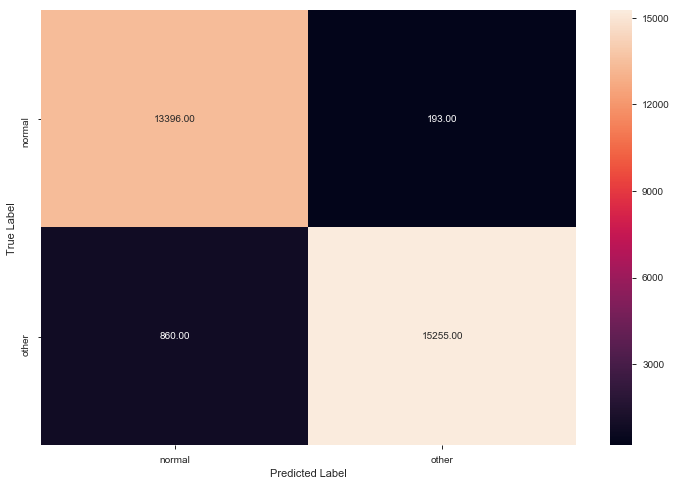

In [142]:
tree_cm = metrics.confusion_matrix(test_pred_dt.predicted, test_pred_dt.actual, [1,0])
sns.heatmap(tree_cm, annot = True, fmt = '.2f', xticklabels = ['normal','other'], yticklabels = ['normal','other'])
plt.ylabel("True Label")
plt.xlabel("Predicted Label")

In [143]:
print(metrics.classification_report(train_pred_dt.actual,train_pred_dt.predicted))

              precision    recall  f1-score   support

           0       0.95      0.98      0.97     61606
           1       0.98      0.94      0.96     57207

   micro avg       0.96      0.96      0.96    118813
   macro avg       0.96      0.96      0.96    118813
weighted avg       0.96      0.96      0.96    118813



In [144]:
print(metrics.classification_report(test_pred_dt.actual,test_pred_dt.predicted))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97     15448
           1       0.99      0.94      0.96     14256

   micro avg       0.96      0.96      0.96     29704
   macro avg       0.97      0.96      0.96     29704
weighted avg       0.97      0.96      0.96     29704



We see that the precision and recall has improved a lot while using Decision Trees, but it might also be due to overfitting, so we need to fine tune the parameters

#### Fine Tuning the Parameters

In [149]:
pGrid = {'max_depth': [4,5,6,7,8],
        'min_samples_leaf':[20,40,60],
        'min_samples_split':[50,75,100]}

gscv_dt = GridSearchCV(estimator = DecisionTreeClassifier(),param_grid=pGrid,cv = 6, scoring='recall',verbose = True)

In [150]:
gscv_dt.fit(train_X, train_y)

Fitting 6 folds for each of 45 candidates, totalling 270 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 270 out of 270 | elapsed:  4.5min finished


GridSearchCV(cv=6, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_depth': [4, 5, 6, 7, 8], 'min_samples_leaf': [20, 40, 60], 'min_samples_split': [50, 75, 100]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=True)

In [151]:
gscv_dt.best_params_

{'max_depth': 8, 'min_samples_leaf': 60, 'min_samples_split': 50}

In [160]:
gscv_dt.best_estimator_

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=8,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=60, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [152]:
print(metrics.accuracy_score(train_y,gscv_dt.best_estimator_.predict(train_X)))

0.9819043370674926


In [164]:
train_pred_dt_final = gscv_dt.predict(train_X)

In [165]:
print(metrics.classification_report(train_y, train_pred_dt_final))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98     61606
           1       0.99      0.98      0.98     57207

   micro avg       0.98      0.98      0.98    118813
   macro avg       0.98      0.98      0.98    118813
weighted avg       0.98      0.98      0.98    118813



In [166]:
test_pred_dt_final = gscv_dt.predict(test_X)

In [167]:
print(metrics.classification_report(test_y, test_pred_dt_final))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98     15448
           1       0.99      0.98      0.98     14256

   micro avg       0.98      0.98      0.98     29704
   macro avg       0.98      0.98      0.98     29704
weighted avg       0.98      0.98      0.98     29704



### Building Final Decision Tree Model

In [169]:
clf_tree = DecisionTreeClassifier(max_depth=8, random_state = 12)
clf_tree.fit(train_X, train_y)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=8,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=12,
            splitter='best')

### Feature Importance

In [170]:
train_X.columns

Index(['count', 'diff_srv_rate', 'dst_bytes', 'dst_host_count',
       'dst_host_diff_srv_rate', 'dst_host_rerror_rate',
       'dst_host_same_src_port_rate', 'dst_host_same_srv_rate',
       'dst_host_serror_rate', 'dst_host_srv_count',
       ...
       'service_urp_i', 'service_uucp', 'service_uucp_path', 'service_vmnet',
       'service_whois', 'src_bytes', 'srv_count', 'srv_diff_host_rate',
       'srv_rerror_rate', 'srv_serror_rate'],
      dtype='object', length=105)

In [171]:
clf_tree.feature_importances_

array([4.00843901e-03, 1.42283641e-04, 2.43390454e-02, 2.36222615e-02,
       8.25702400e-04, 2.54623344e-04, 0.00000000e+00, 1.00888027e-02,
       3.49173855e-03, 3.00913352e-04, 4.04927066e-03, 1.08131912e-02,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 4.61446871e-04, 0.00000000e+00, 0.00000000e+00,
       3.14776264e-04, 0.00000000e+00, 1.06812679e-02, 3.85985609e-04,
       7.92619887e-03, 0.00000000e+00, 2.98742152e-03, 0.00000000e+00,
       1.06827831e-03, 6.25230749e-05, 2.66623714e-05, 1.78222074e-04,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 1.86685577e-03, 0.00000000e+00,
       0.00000000e+00, 7.68441441e-02, 0.00000000e+00, 0.00000000e+00,
       2.73032243e-03, 0.00000000e+00, 3.46237144e-04, 6.86431619e-05,
       0.00000000e+00, 0.00000000e+00, 4.61901058e-02, 0.00000000e+00,
      

In [172]:
list(zip(train_X.columns, clf_tree.feature_importances_))

[('count', 0.0040084390101922255),
 ('diff_srv_rate', 0.00014228364100535767),
 ('dst_bytes', 0.02433904536213719),
 ('dst_host_count', 0.02362226154257002),
 ('dst_host_diff_srv_rate', 0.000825702399842677),
 ('dst_host_rerror_rate', 0.00025462334351178753),
 ('dst_host_same_src_port_rate', 0.0),
 ('dst_host_same_srv_rate', 0.010088802727387252),
 ('dst_host_serror_rate', 0.0034917385511391607),
 ('dst_host_srv_count', 0.0003009133522979676),
 ('dst_host_srv_diff_host_rate', 0.004049270658996243),
 ('duration', 0.010813191203852168),
 ('flag_REJ', 0.0),
 ('flag_RSTO', 0.0),
 ('flag_RSTOS0', 0.0),
 ('flag_RSTR', 0.0),
 ('flag_S0', 0.0),
 ('flag_S1', 0.0004614468710595329),
 ('flag_S2', 0.0),
 ('flag_S3', 0.0),
 ('flag_SF', 0.0003147762637804863),
 ('flag_SH', 0.0),
 ('hot', 0.010681267913478528),
 ('is_guest_login', 0.00038598560867183617),
 ('logged_in', 0.007926198870364894),
 ('num_compromised', 0.0),
 ('protocol_type_tcp', 0.0029874215208916762),
 ('protocol_type_udp', 0.0),
 ('rer

In [173]:
test_pred_dt = pd.DataFrame({'actual':test_y, 'predicted':clf_tree.predict(test_X)})

In [174]:
test_pred_dt.sample(n=10)

,actual,predicted
1098,0,0
38385,0,0
37214,0,0
3138,1,1
39263,0,0
32391,1,1
63803,1,1
108477,1,1
9729,1,1
70921,1,1


In [175]:
metrics.accuracy_score(test_pred_dt.actual, test_pred_dt.predicted)

0.9842782116886615